# Install and Import Libraries

In [1]:
# Install necessary packages
!pip install --upgrade tensorflow tensorflow-datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 117.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 114.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 6.4 MB/s eta 0:00:00


In [2]:
# Import libraries
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Load and Preprocess the Dataset

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.W09IDR_2.0.0/patch_camelyon-test.tfrecord*...:  …

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.W09IDR_2.0.0/patch_camelyon-train.tfrecord*...: …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.W09IDR_2.0.0/patch_camelyon-validation.tfrecord*…

Dataset patch_camelyon downloaded and prepared to /root/tensorflow_datasets/patch_camelyon/2.0.0. Subsequent calls will reuse this data.
Dataset Info:
tfds.core.DatasetInfo(
    name='patch_camelyon',
    full_name='patch_camelyon/2.0.0',
    description="""
    The PatchCamelyon benchmark is a new and challenging image classification
    dataset. It consists of 327.680 color images (96 x 96px) extracted from
    histopathologic scans of lymph node sections. Each image is annoted with a
    binary label indicating presence of metastatic tissue. PCam provides a new
    benchmark for machine learning models: bigger than CIFAR10, smaller than
    Imagenet, trainable on a single GPU.
    """,
    homepage='https://patchcamelyon.grand-challenge.org/',
    data_dir='/root/tensorflow_datasets/patch_camelyon/2.0.0',
    file_format=tfrecord,
    download_size=7.48 GiB,
    dataset_size=7.06 GiB,
    features=FeaturesDict({
        'id': Text(shape=(), dtype=string),
        'image': Image(shap

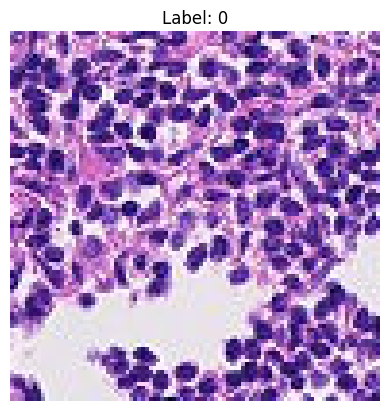

In [3]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Enable memory growth for GPUs (avoid crashes)
physical_devices = tf.config.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

# Load PatchCamelyon dataset efficiently
(ds_train, ds_validation, ds_test), ds_info = tfds.load(
    'patch_camelyon',
    split=['train[:80%]', 'train[80%:]', 'validation'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

# Verify loaded dataset
print(f"Dataset Info:\n{ds_info}")

# Example: view a sample image
import matplotlib.pyplot as plt

def show_sample(image, label):
    plt.imshow(image.numpy())
    plt.title(f"Label: {label.numpy()}")
    plt.axis('off')

for image, label in ds_train.take(1):
    show_sample(image, label)


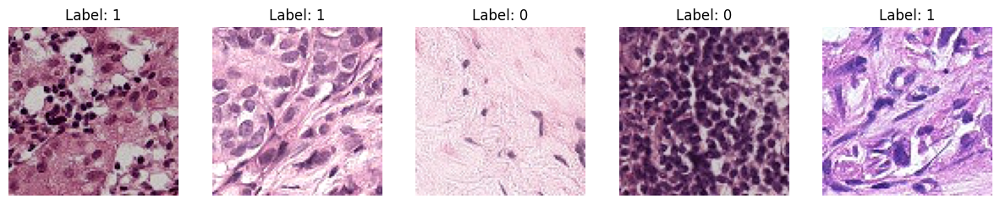

In [4]:
# Define preprocessing and augmentation functions
def preprocess(image, label):
    # Normalise images to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize images to ensure consistent input size (if required by your models)
    image = tf.image.resize(image, [96, 96])
    return image, label

# Augmentation function according to PDM plan (rotation, flip, contrast)
def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    image = tf.clip_by_value(image, 0.0, 1.0)  # Ensure pixel values are within [0,1]
    return image, label

# Apply preprocessing, augmentation, batching, caching, and prefetching
batch_size = 64

# Training dataset pipeline
ds_train = (
    ds_train
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .map(augment, num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .shuffle(1000)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
)

# Test dataset pipeline (no augmentation, just preprocessing)
ds_test = (
    ds_test
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(batch_size)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

# Check a batch of training images
for images, labels in ds_train.take(1):
    plt.figure(figsize=(15, 5))
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.imshow(images[i].numpy())
        plt.title(f'Label: {labels[i].numpy()}')
        plt.axis('off')
    plt.show()


# Define the Custom MM-SEN-Inspired Model

In [5]:
from tensorflow.keras.layers import Input, Conv2D, GlobalAveragePooling2D, Dense, Concatenate, Multiply, Reshape
from tensorflow.keras.models import Model

def simple_attention_block(x):
    channels = x.shape[-1]
    attention = GlobalAveragePooling2D()(x)
    attention = Dense(channels // 2, activation='relu')(attention)
    attention = Dense(channels, activation='sigmoid')(attention)
    attention = Reshape((1, 1, channels))(attention)
    return Multiply()([x, attention])

input_layer = Input(shape=(96, 96, 3))

branch1 = Conv2D(32, (3,3), activation='relu', padding='same')(input_layer)
branch2 = Conv2D(32, (5,5), activation='relu', padding='same')(input_layer)
branch3 = Conv2D(32, (7,7), activation='relu', padding='same')(input_layer)

combined = Concatenate()([branch1, branch2, branch3])
attention_output = simple_attention_block(combined)
x = GlobalAveragePooling2D()(attention_output)
output_layer = Dense(1, activation='sigmoid')(x)

custom_mmsen_model = Model(inputs=input_layer, outputs=output_layer)
custom_mmsen_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 96, 96,    │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 96, 96,    │      2,432 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 96, 96,    │      4,736 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 96, 96,    │          0 │ conv2d[0][0],     │
│ (Concatenate)       │ 96)               │            │ conv2d_1[0][0],   │
│                     │                   │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 96)        │          0 │ concatenate[0][0] │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 48)        │      4,656 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 96)        │      4,704 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 96)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 96, 96,    │          0 │ concatenate[0][0… │
│                     │ 96)               │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 96)        │          0 │ multiply[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1)         │         97 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 17,521 (68.44 KB)

 Trainable params: 17,521 (68.44 KB)

 Non-trainable params: 0 (0.00 B)

# Compile and Train the Model (40 epochs)

In [6]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Set random seed for reproducibility
tf.random.set_seed(42)

# Compile the custom MM-SEN model
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Add EarlyStopping to stop training if no improvement in validation loss for 10 epochs
early_stopping = EarlyStopping(
    monitor='val_loss',          # Monitors validation loss
    patience=10,                  # Stops if no improvement for 10 epochs
    restore_best_weights=True,   # Restores model weights from the best epoch
    verbose=1
)

# Add ModelCheckpoint to save the best model during training
checkpoint = ModelCheckpoint(
    filepath='/content/custom_mmsen_best_model.h5',   # Path to save the model
    monitor='val_loss',                              # Monitors validation loss
    save_best_only=True,                              # Saves only the best model
    verbose=1
)

# Train the model with early stopping and model checkpoint
history_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=40,
    validation_data=ds_test,
    callbacks=[early_stopping, checkpoint]   # Adding both callbacks
)

# Save the final model after training
custom_mmsen_model.save('/content/custom_mmsen_final_model.h5')
print("Model saved after training!")


Epoch 1/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.6812 - auc: 0.7480 - loss: 0.5923
Epoch 1: val_loss improved from inf to 0.54968, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1137s 346ms/step - accuracy: 0.6812 - auc: 0.7480 - loss: 0.5923 - val_accuracy: 0.7240 - val_auc: 0.8077 - val_loss: 0.5497
Epoch 2/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step - accuracy: 0.7431 - auc: 0.8146 - loss: 0.5287
Epoch 2: val_loss improved from 0.54968 to 0.54619, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1053s 321ms/step - accuracy: 0.7431 - auc: 0.8146 - loss: 0.5287 - val_accuracy: 0.7258 - val_auc: 0.8054 - val_loss: 0.5462
Epoch 3/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - accuracy: 0.7541 - auc: 0.8284 - loss: 0.5109
Epoch 3: val_loss did not improve from 0.54619
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1066s 325ms/step - accuracy: 0.7541 - auc: 0.8284 - loss: 0.5109 - val_accuracy: 0.7311 - val_auc: 0.8336 - val_loss: 0.5522
Epoch 4/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - accuracy: 0.7668 - auc: 0.8423 - loss: 0.4926
Epoch 4: val_loss improved from 0.54619 to 0.50670, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1072s 327ms/step - accuracy: 0.7668 - auc: 0.8423 - loss: 0.4926 - val_accuracy: 0.7560 - val_auc: 0.8455 - val_loss: 0.5067
Epoch 5/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step - accuracy: 0.7724 - auc: 0.8500 - loss: 0.4816
Epoch 5: val_loss improved from 0.50670 to 0.47839, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1081s 330ms/step - accuracy: 0.7724 - auc: 0.8500 - loss: 0.4816 - val_accuracy: 0.7647 - val_auc: 0.8555 - val_loss: 0.4784
Epoch 6/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step - accuracy: 0.7795 - auc: 0.8582 - loss: 0.4696
Epoch 6: val_loss did not improve from 0.47839
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1087s 332ms/step - accuracy: 0.7795 - auc: 0.8582 - loss: 0.4696 - val_accuracy: 0.7513 - val_auc: 0.8399 - val_loss: 0.5003
Epoch 7/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step - accuracy: 0.7852 - auc: 0.8651 - loss: 0.4588
Epoch 7: val_loss did not improve from 0.47839
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1096s 334ms/step - accuracy: 0.7852 - auc: 0.8651 - loss: 0.4588 - val_accuracy: 0.7371 - val_auc: 0.8487 - val_loss: 0.5213
Epoch 8/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step - accuracy: 0.7874 - auc: 0.8683 - loss: 0.4538
Epoch 8: val_loss improved from 0.47839 to 0.47256, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1094s 334ms/step - accuracy: 0.7874 - auc: 0.8683 - loss: 0.4538 - val_accuracy: 0.7669 - val_auc: 0.8628 - val_loss: 0.4726
Epoch 9/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - accuracy: 0.7926 - auc: 0.8741 - loss: 0.4443
Epoch 9: val_loss did not improve from 0.47256
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1100s 336ms/step - accuracy: 0.7926 - auc: 0.8741 - loss: 0.4443 - val_accuracy: 0.7539 - val_auc: 0.8587 - val_loss: 0.4959
Epoch 10/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - accuracy: 0.7961 - auc: 0.8763 - loss: 0.4405
Epoch 10: val_loss improved from 0.47256 to 0.45891, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1105s 337ms/step - accuracy: 0.7961 - auc: 0.8763 - loss: 0.4405 - val_accuracy: 0.7727 - val_auc: 0.8664 - val_loss: 0.4589
Epoch 11/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - accuracy: 0.7996 - auc: 0.8810 - loss: 0.4325
Epoch 11: val_loss did not improve from 0.45891
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1105s 337ms/step - accuracy: 0.7996 - auc: 0.8810 - loss: 0.4325 - val_accuracy: 0.7458 - val_auc: 0.8641 - val_loss: 0.5122
Epoch 12/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step - accuracy: 0.8019 - auc: 0.8841 - loss: 0.4272
Epoch 12: val_loss improved from 0.45891 to 0.45290, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1114s 340ms/step - accuracy: 0.8019 - auc: 0.8841 - loss: 0.4272 - val_accuracy: 0.7778 - val_auc: 0.8672 - val_loss: 0.4529
Epoch 13/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - accuracy: 0.8059 - auc: 0.8881 - loss: 0.4201
Epoch 13: val_loss did not improve from 0.45290
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1124s 343ms/step - accuracy: 0.8059 - auc: 0.8881 - loss: 0.4201 - val_accuracy: 0.7701 - val_auc: 0.8576 - val_loss: 0.4672
Epoch 14/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - accuracy: 0.8086 - auc: 0.8900 - loss: 0.4167
Epoch 14: val_loss did not improve from 0.45290
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1126s 344ms/step - accuracy: 0.8086 - auc: 0.8900 - loss: 0.4167 - val_accuracy: 0.7696 - val_auc: 0.8616 - val_loss: 0.4638
Epoch 15/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.8114 - auc: 0.8931 - loss: 0.4110
Epoch 15: val_loss improved from 0.45290 to 0.44074, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1139s 347ms/step - accuracy: 0.8114 - auc: 0.8931 - loss: 0.4110 - val_accuracy: 0.7847 - val_auc: 0.8774 - val_loss: 0.4407
Epoch 16/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.8111 - auc: 0.8946 - loss: 0.4082
Epoch 16: val_loss did not improve from 0.44074
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1146s 350ms/step - accuracy: 0.8111 - auc: 0.8946 - loss: 0.4082 - val_accuracy: 0.7640 - val_auc: 0.8819 - val_loss: 0.4637
Epoch 17/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - accuracy: 0.8156 - auc: 0.8973 - loss: 0.4034
Epoch 17: val_loss improved from 0.44074 to 0.43970, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1146s 350ms/step - accuracy: 0.8156 - auc: 0.8973 - loss: 0.4034 - val_accuracy: 0.7918 - val_auc: 0.8738 - val_loss: 0.4397
Epoch 18/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.8176 - auc: 0.8999 - loss: 0.3989
Epoch 18: val_loss did not improve from 0.43970
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1153s 352ms/step - accuracy: 0.8176 - auc: 0.8999 - loss: 0.3989 - val_accuracy: 0.7434 - val_auc: 0.8641 - val_loss: 0.5137
Epoch 19/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.8206 - auc: 0.9027 - loss: 0.3935
Epoch 19: val_loss did not improve from 0.43970
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1151s 351ms/step - accuracy: 0.8206 - auc: 0.9027 - loss: 0.3935 - val_accuracy: 0.7598 - val_auc: 0.8678 - val_loss: 0.4760
Epoch 20/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.8219 - auc: 0.9044 - loss: 0.3902
Epoch 20: val_loss improved from 0.43970 to 0.42237, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1152s 352ms/step - accuracy: 0.8219 - auc: 0.9044 - loss: 0.3902 - val_accuracy: 0.7964 - val_auc: 0.8849 - val_loss: 0.4224
Epoch 21/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8232 - auc: 0.9057 - loss: 0.3877
Epoch 21: val_loss did not improve from 0.42237
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1157s 353ms/step - accuracy: 0.8232 - auc: 0.9057 - loss: 0.3877 - val_accuracy: 0.7960 - val_auc: 0.8810 - val_loss: 0.4298
Epoch 22/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8250 - auc: 0.9070 - loss: 0.3851
Epoch 22: val_loss improved from 0.42237 to 0.41767, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1156s 353ms/step - accuracy: 0.8250 - auc: 0.9070 - loss: 0.3851 - val_accuracy: 0.7939 - val_auc: 0.9006 - val_loss: 0.4177
Epoch 23/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8264 - auc: 0.9085 - loss: 0.3825
Epoch 23: val_loss did not improve from 0.41767
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1157s 353ms/step - accuracy: 0.8264 - auc: 0.9085 - loss: 0.3825 - val_accuracy: 0.7868 - val_auc: 0.8843 - val_loss: 0.4332
Epoch 24/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step - accuracy: 0.8276 - auc: 0.9093 - loss: 0.3806
Epoch 24: val_loss improved from 0.41767 to 0.40873, saving model to /content/custom_mmsen_best_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1161s 354ms/step - accuracy: 0.8276 - auc: 0.9093 - loss: 0.3806 - val_accuracy: 0.8030 - val_auc: 0.8928 - val_loss: 0.4087
Epoch 25/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - accuracy: 0.8297 - auc: 0.9112 - loss: 0.3770
Epoch 25: val_loss did not improve from 0.40873
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1157s 353ms/step - accuracy: 0.8297 - auc: 0.9112 - loss: 0.3770 - val_accuracy: 0.7735 - val_auc: 0.8622 - val_loss: 0.4679
Epoch 26/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step - accuracy: 0.8298 - auc: 0.9124 - loss: 0.3745
Epoch 26: val_loss did not improve from 0.40873
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1160s 354ms/step - accuracy: 0.8298 - auc: 0.9124 - loss: 0.3745 - val_accuracy: 0.7972 - val_auc: 0.8870 - val_loss: 0.4315
Epoch 27/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - accuracy: 0.8313 - auc: 0.9133 - loss: 0.3728
Epoch 27: val_loss did not improve from 0.40873
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1170s 357ms/step - accuracy: 0.8313 - auc:

Model saved after training!


In [7]:
best_model = tf.keras.models.load_model('/content/custom_mmsen_best_model.h5')

# Visualisation and Evaluation After Initial Training

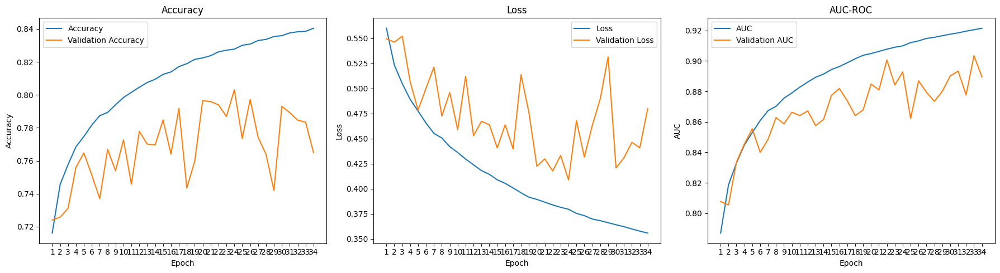

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━

In [8]:
# Plotting function
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history):
    epochs = np.arange(1, len(history.history['accuracy']) + 1)

    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, history.history['accuracy'], label='Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.xticks(epochs)
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, history.history['loss'], label='Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(epochs)
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, history.history['auc'], label='AUC')
    plt.plot(epochs, history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.xticks(epochs)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Evaluation function
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("F1 Score:", f1_score(y_true, y_pred))
    print("AUC-ROC:", roc_auc_score(y_true, y_pred))

# Run evaluation and visualisation
plot_training_curves(history_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)

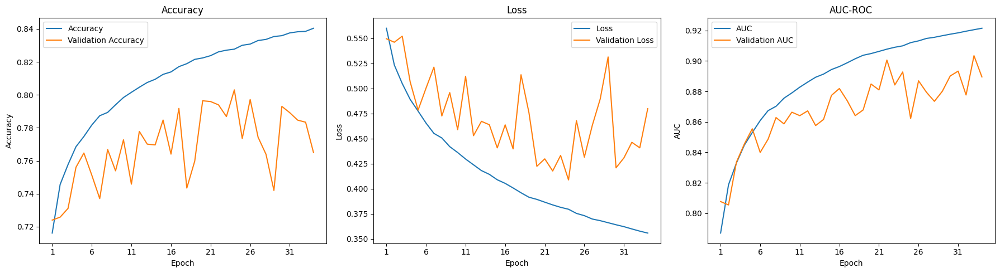

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━

In [27]:
# Plotting function
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history):
    epochs = np.arange(1, len(history.history['accuracy']) + 1)

    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, history.history['accuracy'], label='Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.xticks(np.arange(1, len(epochs) + 1, step=5))  # Setting step to 5 for clear spacing
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, history.history['loss'], label='Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(np.arange(1, len(epochs) + 1, step=5))  # Setting step to 5 for clear spacing
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, history.history['auc'], label='AUC')
    plt.plot(epochs, history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.xticks(np.arange(1, len(epochs) + 1, step=5))  # Setting step to 5 for clear spacing
    plt.legend()

    plt.tight_layout()
    plt.show()

# Evaluation function
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("F1 Score:", f1_score(y_true, y_pred))
    print("AUC-ROC:", roc_auc_score(y_true, y_pred))

# Run evaluation and visualisation
plot_training_curves(history_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


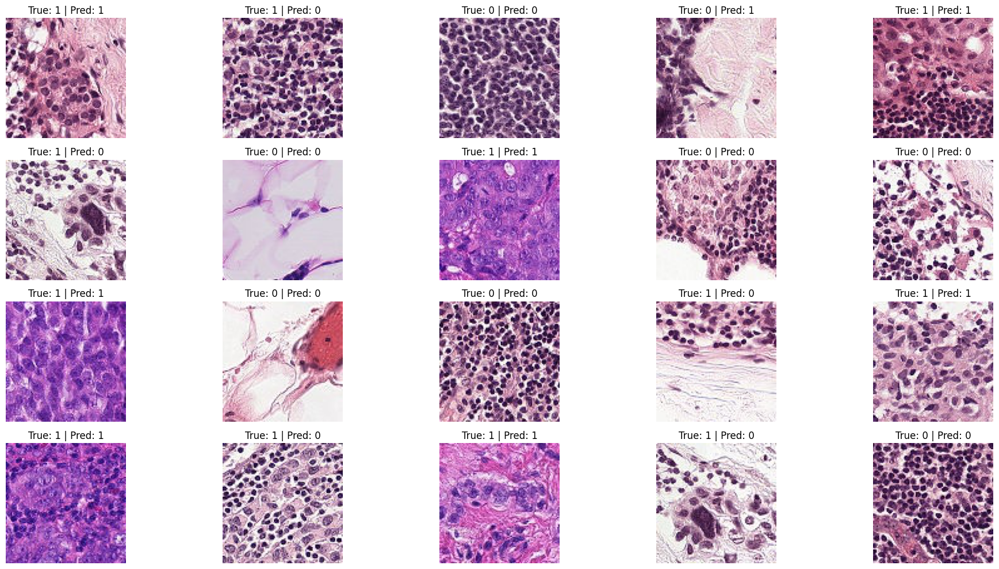

In [9]:
# Function to visualise predictions on 20 test images clearly
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0
    for images, labels in dataset:
        predictions = model.predict(images)
        preds_rounded = np.round(predictions).astype(int).flatten()

        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {preds_rounded[i]}")
            plt.axis('off')

            images_shown += 1
            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Execute clearly after your training and evaluation
visualize_predictions(custom_mmsen_model, ds_test, num_images=20)


 # Fine-tuning (Further 10 epochs)

In [10]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Set random seed for reproducibility
tf.random.set_seed(42)

# Recompile the model with a lower learning rate for fine-tuning
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-6),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Early stopping to prevent overfitting during fine-tuning
early_stopping_finetune = EarlyStopping(
    monitor='val_loss',          # Monitor validation loss
    patience=3,                  # Stops if no improvement for 3 epochs
    restore_best_weights=True,   # Restores best model weights
    verbose=1
)

# Model checkpoint to save the best fine-tuned model
checkpoint_finetune = ModelCheckpoint(
    filepath='/content/custom_mmsen_best_finetune_model.h5',  # Save path
    monitor='val_loss',                                      # Monitor validation loss
    save_best_only=True,                                      # Save only the best model
    verbose=1
)

# Further fine-tuning for 10 epochs
history_finetune_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=10,
    validation_data=ds_test,
    callbacks=[early_stopping_finetune, checkpoint_finetune]  # Adding callbacks
)

# Save the final fine-tuned model after training
custom_mmsen_model.save('/content/custom_mmsen_finetuned_final.h5')
print("Fine-tuned model saved after further training!")


Epoch 1/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8388 - auc: 0.9195 - loss: 0.3598
Epoch 1: val_loss improved from inf to 0.41375, saving model to /content/custom_mmsen_best_finetune_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1258s 383ms/step - accuracy: 0.8388 - auc: 0.9195 - loss: 0.3598 - val_accuracy: 0.7983 - val_auc: 0.8938 - val_loss: 0.4138
Epoch 2/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8409 - auc: 0.9212 - loss: 0.3563
Epoch 2: val_loss did not improve from 0.41375
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1256s 383ms/step - accuracy: 0.8409 - auc: 0.9212 - loss: 0.3563 - val_accuracy: 0.7986 - val_auc: 0.8939 - val_loss: 0.4142
Epoch 3/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8415 - auc: 0.9217 - loss: 0.3553
Epoch 3: val_loss improved from 0.41375 to 0.41272, saving model to /content/custom_mmsen_best_finetune_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1253s 382ms/step - accuracy: 0.8415 - auc: 0.9217 - loss: 0.3553 - val_accuracy: 0.7984 - val_auc: 0.8944 - val_loss: 0.4127
Epoch 4/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8419 - auc: 0.9221 - loss: 0.3544
Epoch 4: val_loss improved from 0.41272 to 0.41199, saving model to /content/custom_mmsen_best_finetune_model.h5


3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1253s 382ms/step - accuracy: 0.8419 - auc: 0.9221 - loss: 0.3544 - val_accuracy: 0.7994 - val_auc: 0.8947 - val_loss: 0.4120
Epoch 5/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8422 - auc: 0.9223 - loss: 0.3540
Epoch 5: val_loss did not improve from 0.41199
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1253s 382ms/step - accuracy: 0.8422 - auc: 0.9223 - loss: 0.3540 - val_accuracy: 0.7989 - val_auc: 0.8948 - val_loss: 0.4126
Epoch 6/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8422 - auc: 0.9225 - loss: 0.3534
Epoch 6: val_loss did not improve from 0.41199
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1253s 382ms/step - accuracy: 0.8422 - auc: 0.9225 - loss: 0.3534 - val_accuracy: 0.7989 - val_auc: 0.8948 - val_loss: 0.4129
Epoch 7/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step - accuracy: 0.8425 - auc: 0.9227 - loss: 0.3531
Epoch 7: val_loss did not improve from 0.41199
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1253s 382ms/step - accuracy: 0.8425 - auc: 0.922

Fine-tuned model saved after further training!


# Final Evaluation and Visualisation After Fine-tuning

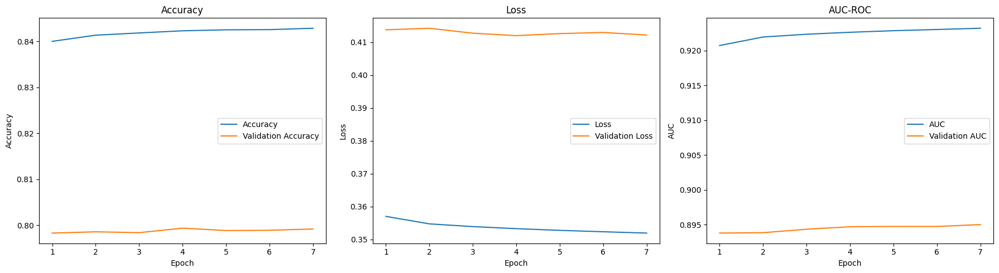

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━

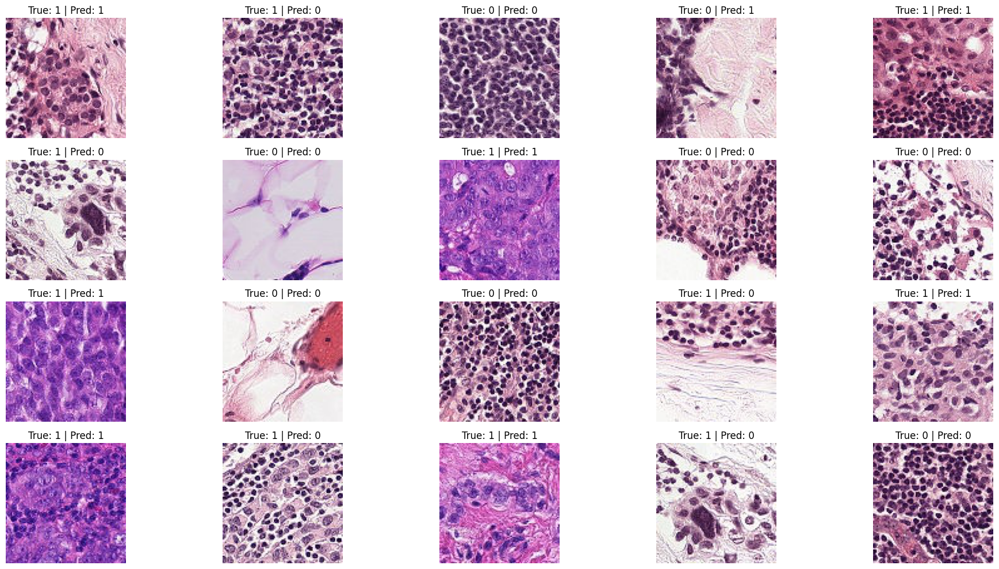

In [11]:
# Evaluate and visualise after fine-tuning (additional 10 epochs)
plot_training_curves(history_finetune_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)

# Clearly visualise predictions on 20 test images after fine-tuning
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0
    for images, labels in dataset:
        predictions = model.predict(images)
        preds_rounded = np.round(predictions).astype(int).flatten()
        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {preds_rounded[i]}")
            plt.axis('off')
            images_shown += 1
            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Execute visualisation after fine-tuning
visualize_predictions(custom_mmsen_model, ds_test)


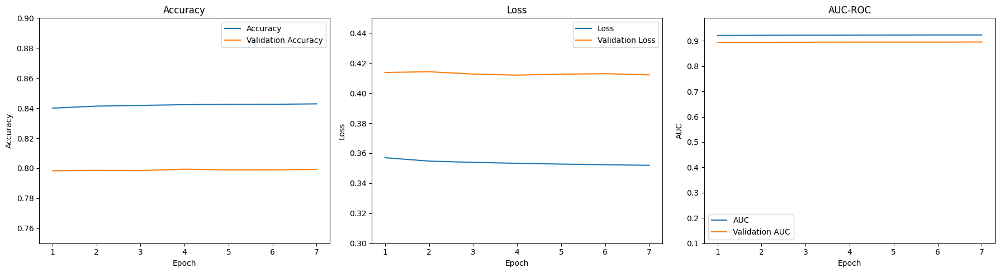

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━

In [34]:
# Plotting function with improved y-axis scaling
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history):
    epochs = np.arange(1, len(history.history['accuracy']) + 1)

    plt.figure(figsize=(18, 5))

    # Accuracy Plot
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history.history['accuracy'], label='Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0.75, 0.90)  # Set y-axis range to better reflect the accuracy spread
    plt.xticks(np.arange(1, len(epochs) + 1, step=1))
    plt.legend()

    # Loss Plot
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history.history['loss'], label='Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.ylim(0.30, 0.45)  # Set y-axis range to better capture the loss variations
    plt.xticks(np.arange(1, len(epochs) + 1, step=1))
    plt.legend()

    # AUC-ROC Plot
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history.history['auc'], label='AUC')
    plt.plot(epochs, history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.ylim(0.10, 0.99)  # Adjust y-axis range to focus on AUC differences
    plt.xticks(np.arange(1, len(epochs) + 1, step=1))
    plt.legend()

    plt.tight_layout()
    plt.show()

# Evaluation function
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("F1 Score:", f1_score(y_true, y_pred))
    print("AUC-ROC:", roc_auc_score(y_true, y_pred))

# Run evaluation and visualisation
plot_training_curves(history_finetune_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━

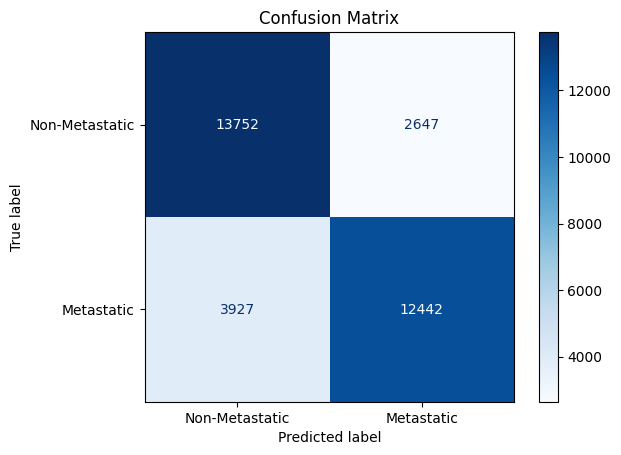

In [12]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Metastatic', 'Metastatic'])
    disp.plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()

# Run after training
plot_confusion_matrix(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━

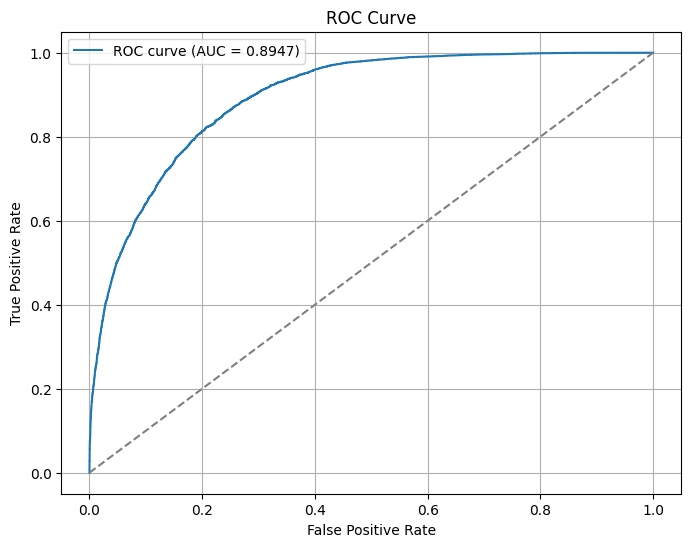

In [13]:
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_curve(model, dataset):
    y_true, y_scores = [], []
    for images, labels in dataset:
        preds = model.predict(images).flatten()
        y_scores.extend(preds)
        y_true.extend(labels.numpy())

    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_score = roc_auc_score(y_true, y_scores)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid()
    plt.show()

# Run after training
plot_roc_curve(custom_mmsen_model, ds_test)


In [14]:
finetuned_model = tf.keras.models.load_model('/content/custom_mmsen_best_finetune_model.h5')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━

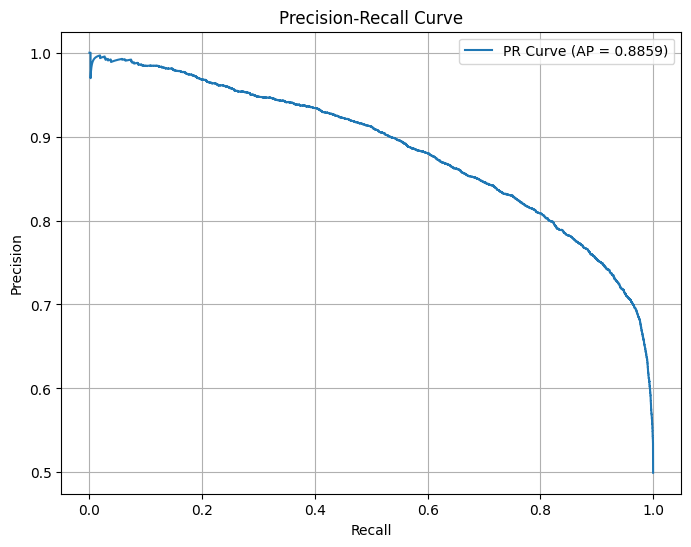

In [15]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def plot_precision_recall_curve(model, dataset):
    y_true, y_scores = [], []
    for images, labels in dataset:
        preds = model.predict(images).flatten()
        y_scores.extend(preds)
        y_true.extend(labels.numpy())

    precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
    ap_score = average_precision_score(y_true, y_scores)

    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label=f'PR Curve (AP = {ap_score:.4f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.grid()
    plt.show()

# Run after training
plot_precision_recall_curve(custom_mmsen_model, ds_test)


In [17]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 19.9 MB/s eta 0:00:00


In [18]:
import tensorflow as tf
import numpy as np
import cv2

def generate_grad_cam(model, image, last_conv_layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.array([image]))
        loss = predictions[:, 0]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs.numpy()[0]
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0) / np.max(conv_outputs)

    heatmap = cv2.resize(heatmap, (96, 96))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = heatmap * 0.4 + (image * 255)
    superimposed_img = np.clip(superimposed_img / superimposed_img.max(), 0, 1)

    return superimposed_img


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=Tensor(shape=(1, 96, 96, 3))
  warnings.warn(msg)


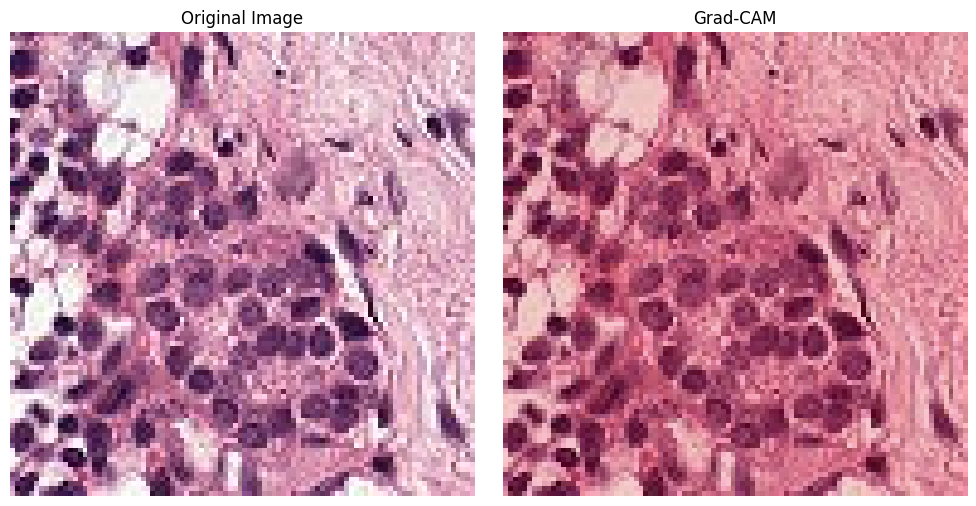

In [19]:
import matplotlib.pyplot as plt

# Example usage (clearly run with one test image)
for images, labels in ds_test.take(1):
    image = images[0].numpy()
    grad_cam_result = generate_grad_cam(custom_mmsen_model, image, last_conv_layer_name='conv2d_2')

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(grad_cam_result)
    plt.title('Grad-CAM')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [20]:
custom_mmsen_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 96, 96,    │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 96, 96,    │      2,432 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 96, 96,    │      4,736 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 96, 96,    │          0 │ conv2d[0][0],     │
│ (Concatenate)       │ 96)               │            │ conv2d_1[0][0],   │
│                     │                   │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 96)        │          0 │ concatenate[0][0] │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 48)        │      4,656 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 96)        │      4,704 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 96)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 96, 96,    │          0 │ concatenate[0][0… │
│                     │ 96)               │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 96)        │          0 │ multiply[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1)         │         97 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 52,565 (205.34 KB)

 Trainable params: 17,521 (68.44 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 35,044 (136.89 KB)

In [21]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Load small demo subset (20 images) from the test set
demo_dataset = ds_test.unbatch().take(20).batch(1)

In [22]:
import numpy as np

predictions = []
true_labels = []

for img, label in demo_dataset:
    pred = custom_mmsen_model.predict(img)
    predictions.append(np.round(pred).astype(int).flatten()[0])
    true_labels.append(label.numpy().flatten()[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


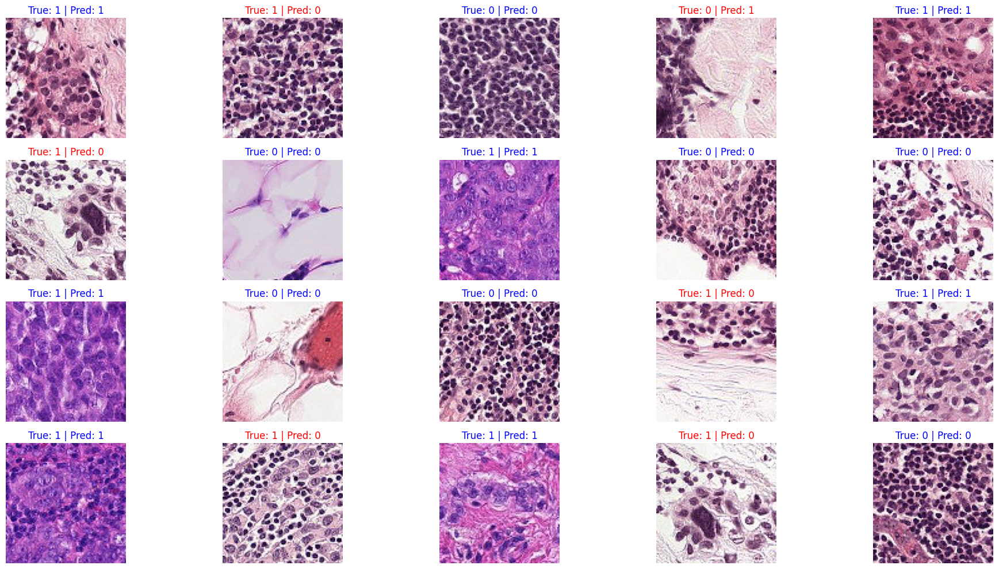

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
for i, (img_batch, pred, true_label) in enumerate(zip(demo_dataset, predictions, true_labels)):
    image = img_batch[0].numpy().squeeze()
    plt.subplot(4, 5, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label} | Pred: {pred}", fontsize=12, color="blue" if pred==true_label else "red")
    plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


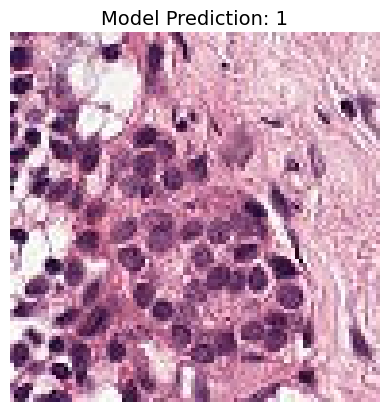

In [24]:
# Interactive prediction function clearly for demo purposes
def predict_single_image(model, image):
    pred = model.predict(tf.expand_dims(image, axis=0))
    pred_label = int(np.round(pred).flatten()[0])

    plt.imshow(image)
    plt.title(f"Model Prediction: {pred_label}", fontsize=14)
    plt.axis('off')
    plt.show()

# Clearly pick a random image from your demo set for interactive demonstration
for img, label in demo_dataset.take(1):
    predict_single_image(custom_mmsen_model, img.numpy()[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


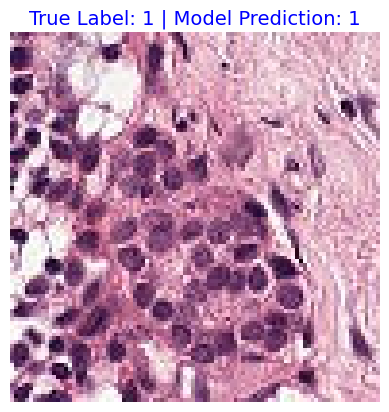

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


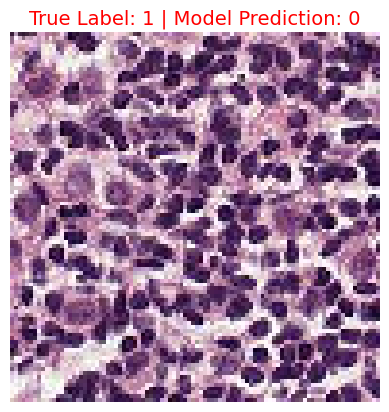

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


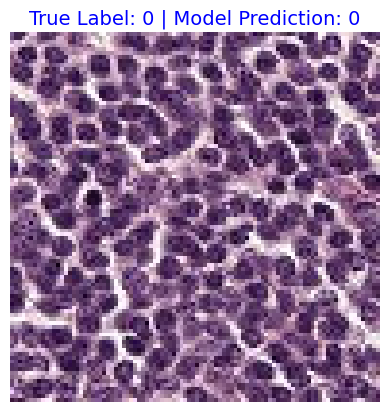

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


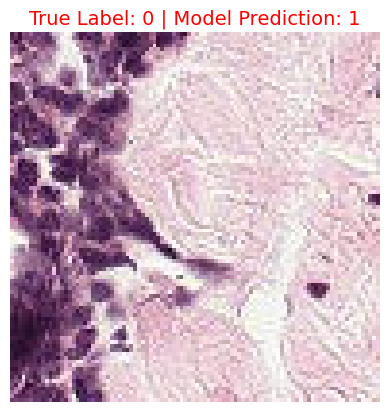

In [25]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Interactive prediction function showing both true and predicted labels
def predict_single_image(model, image, true_label):
    pred = model.predict(tf.expand_dims(image, axis=0))
    pred_label = int(np.round(pred).flatten()[0])

    plt.imshow(image)
    plt.title(f"True Label: {true_label} | Model Prediction: {pred_label}",
              fontsize=14,
              color="blue" if pred_label == true_label else "red")
    plt.axis('off')
    plt.show()

# Clearly demonstrate predictions on 4 images interactively
for img_batch, label_batch in demo_dataset.take(4):
    image = img_batch[0].numpy().squeeze()
    true_label = label_batch.numpy()[0]
    predict_single_image(custom_mmsen_model, image, true_label)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━

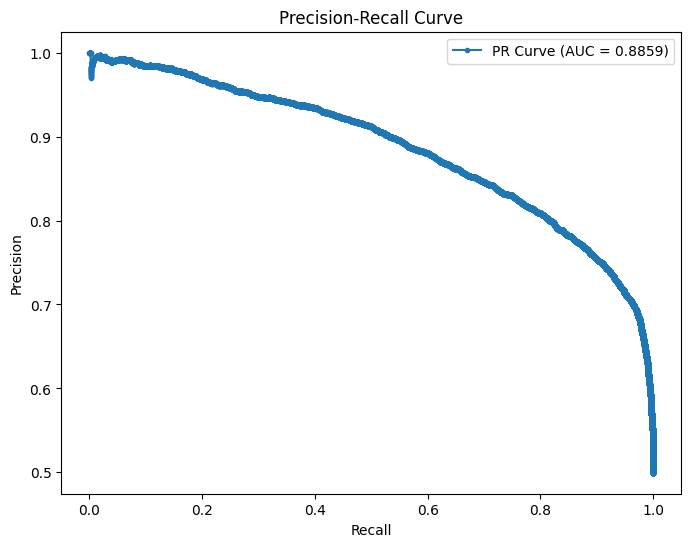

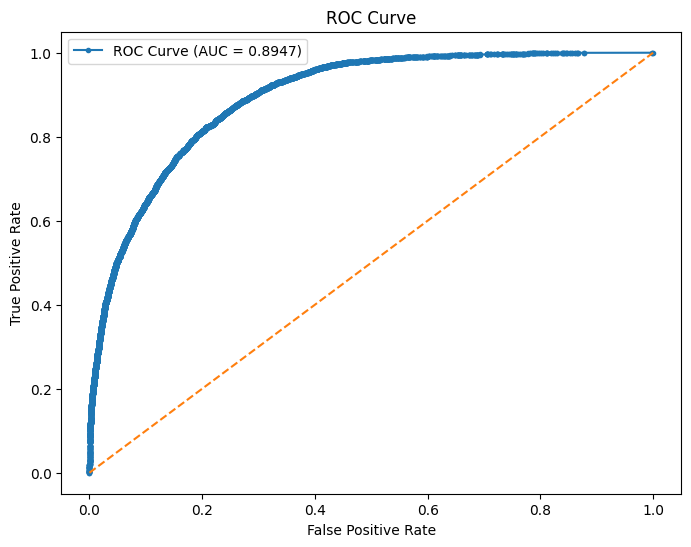

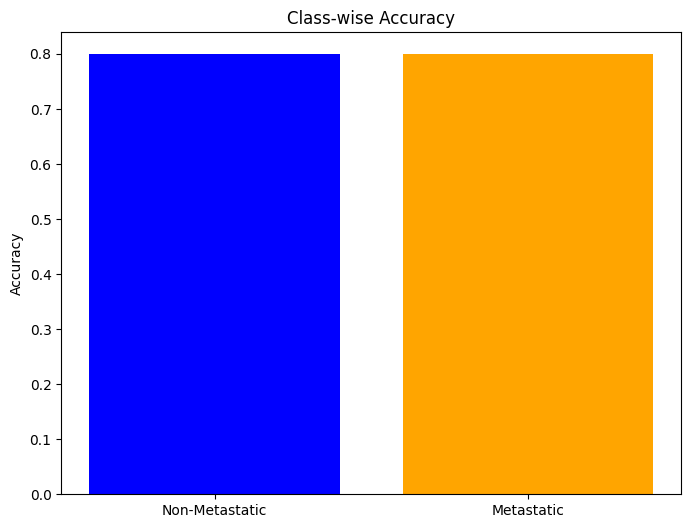

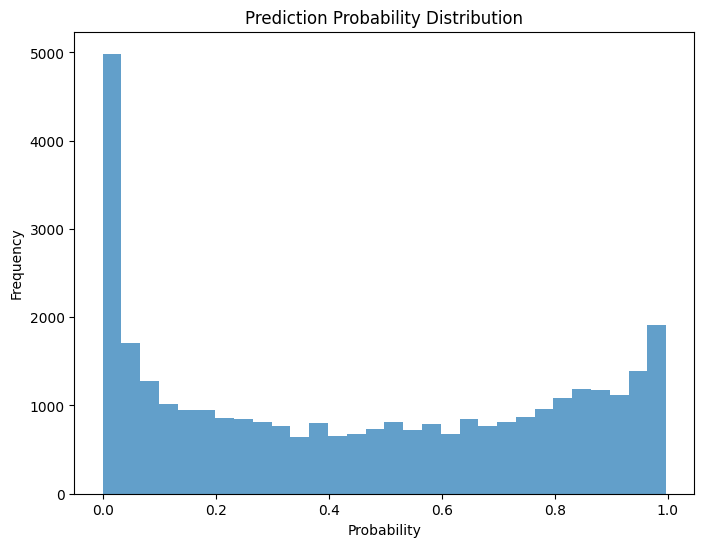

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


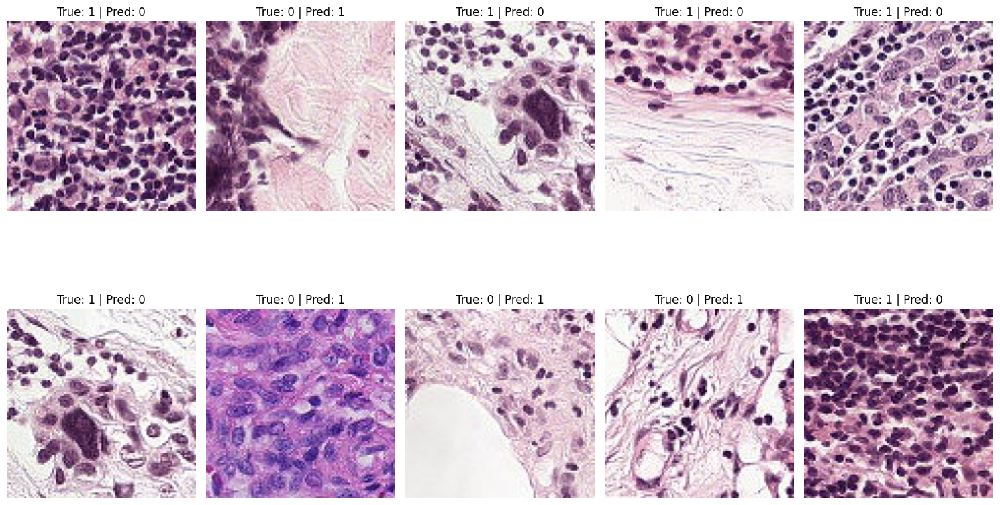

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, roc_curve, auc, classification_report

def plot_precision_recall_curve(y_true, y_pred_prob):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_prob)
    auc_pr = auc(recall, precision)
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.', label=f'PR Curve (AUC = {auc_pr:.4f})')
    plt.title("Precision-Recall Curve")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.show()

def plot_roc_curve(y_true, y_pred_prob):
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    auc_roc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.', label=f'ROC Curve (AUC = {auc_roc:.4f})')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.title("ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.show()

def plot_class_accuracy(y_true, y_pred):
    from sklearn.metrics import accuracy_score
    classes = ['Non-Metastatic', 'Metastatic']
    accuracies = [accuracy_score(y_true == i, y_pred == i) for i in range(2)]
    plt.figure(figsize=(8, 6))
    plt.bar(classes, accuracies, color=['blue', 'orange'])
    plt.title("Class-wise Accuracy")
    plt.ylabel("Accuracy")
    plt.show()

def plot_prediction_distribution(y_pred_prob):
    plt.figure(figsize=(8, 6))
    plt.hist(y_pred_prob, bins=30, alpha=0.7, label='Predicted Probabilities')
    plt.title("Prediction Probability Distribution")
    plt.xlabel("Probability")
    plt.ylabel("Frequency")
    plt.show()

def plot_misclassified_samples(model, dataset, num_samples=10):
    misclassified = []
    for images, labels in dataset:
        predictions = model.predict(images)
        preds = np.round(predictions).astype(int).flatten()
        for img, label, pred in zip(images, labels, preds):
            if label.numpy() != pred:
                misclassified.append((img, label.numpy(), pred))
            if len(misclassified) >= num_samples:
                break
        if len(misclassified) >= num_samples:
            break

    plt.figure(figsize=(15, 10))
    for i, (img, true_label, pred_label) in enumerate(misclassified):
        plt.subplot(2, 5, i+1)
        plt.imshow(img.numpy())
        plt.title(f"True: {true_label} | Pred: {pred_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Usage after model evaluation
y_true, y_pred_prob = [], []
for images, labels in ds_test:
    preds = custom_mmsen_model.predict(images).flatten()
    y_true.extend(labels.numpy())
    y_pred_prob.extend(preds)

# Plot visuals
plot_precision_recall_curve(y_true, y_pred_prob)
plot_roc_curve(y_true, y_pred_prob)
plot_class_accuracy(np.array(y_true), np.round(y_pred_prob).astype(int))
plot_prediction_distribution(y_pred_prob)
plot_misclassified_samples(custom_mmsen_model, ds_test)


In [36]:
!pip install nbconvert nbformat
!jupyter nbconvert --to notebook --ClearOutputPreprocessor.enabled=True --inplace your_notebook.ipynb

[NbConvertApp] WARNING | pattern 'your_notebook.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
 